#### Life Expectancy EDA

Datasource: *https://www.kaggle.com/code/ahmedabbas757/life-expectancy-prediction*

In [149]:
# Import Required Libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [150]:
# Display all columns
pd.set_option("display.max_columns", None)

#### Data Understanding & Inspection

In [151]:
# Load the Dataset
file_path=r"D:\personalProject\simpleLinearRegression\data\life_expectancy_data.csv"
data=pd.read_csv(file_path)
df=pd.DataFrame(data)
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [152]:
# Getting the dataframe shape
print(f"Dataset shape(rows, columns): {df.shape}")

Dataset shape(rows, columns): (2938, 22)


In [153]:
# Basic Info and Structure
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

----------------------------------------------------------------------------------------------------------------------------
##### Column Defination
=======================

Country : Country

Year : Year

Status : Country Developed or Developing status

Life expectancy : Life expectancy in age

Adult Mortality : Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)

infant deaths : Number of Infant Deaths per 1000 population

Alcohol : Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol) -percentage expenditure: Expenditure on health as a percentage of Gross Domestic Product per capita(%)

Hepatitis B : Hepatitis B (HepB) immunization coverage among 1-year-olds (%)

Measles : Measles - number of reported cases per 1000 population

BMI : Average Body Mass Index of entire population

under-five deaths : Number of under-five deaths per 1000 population

Polio : Polio (Pol3) immunization coverage among 1-year-olds (%)

Total expenditure : General government expenditure on health as a percentage of total government expenditure (%)

Diphtheria : Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)

HIV/AIDS : Deaths per 1 000 live births HIV/AIDS (0-4 years)

GDP : Gross Domestic Product per capita (in USD)

Population : Population of the country

thinness 1-19 years : Prevalence of thinness among children and adolescents for Age 10 to 19 (%)

thinness 5-9 years : Prevalence of thinness among children for Age 5 to 9(%)

Income composition of resources : Human Development Index in terms of income composition of resources (index ranging from 0 to 1)

Schooling : Number of years of Schooling(years)

==========================================================================================================

In [154]:
# Standardization the column names
df.columns=df.columns.str.lower().str.replace(" ", "_")

In [155]:
# Getting column names
df.columns

Index(['country', 'year', 'status', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness_1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'schooling'],
      dtype='object')

In [156]:
def identify_dtypes(df):
    """Identify and group columns by their data types."""
    cat_cols   = df.select_dtypes(include=["object", "category"]).columns
    num_cols   = df.select_dtypes(include=["int64", "float64"]).columns
    
    print(f"Categorical columns: {len(list(cat_cols))}\n", list(cat_cols))
    print("="*50)
    print(f"Numerical columns:{len(list(num_cols))}\n", list(num_cols))
    print("="*100)

identify_dtypes(df)

Categorical columns: 2
 ['country', 'status']
Numerical columns:20
 ['year', 'life_expectancy', 'adult_mortality', 'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b', 'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure', 'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness_1-19_years', 'thinness_5-9_years', 'income_composition_of_resources', 'schooling']


we need to convert the data type of "year" variable.

In [157]:
# Summary stats for all numerical columns
df.describe(include=[np.number]).T.style.format("{:.2f}")

,count,mean,std,min,25%,50%,75%,max
year,2938.00,2007.52,4.61,2000.00,2004.00,2008.00,2012.00,2015.00
life_expectancy,2928.00,69.22,9.52,36.30,63.10,72.10,75.70,89.00
adult_mortality,2928.00,164.80,124.29,1.00,74.00,144.00,228.00,723.00
infant_deaths,2938.00,30.30,117.93,0.00,0.00,3.00,22.00,1800.00
alcohol,2744.00,4.60,4.05,0.01,0.88,3.75,7.70,17.87
percentage_expenditure,2938.00,738.25,1987.91,0.00,4.69,64.91,441.53,19479.91
hepatitis_b,2385.00,80.94,25.07,1.00,77.00,92.00,97.00,99.00
measles,2938.00,2419.59,11467.27,0.00,0.00,17.00,360.25,212183.00
bmi,2904.00,38.32,20.04,1.00,19.30,43.50,56.20,87.30
under-five_deaths,2938.00,42.04,160.45,0.00,0.00,4.00,28.00,2500.00


In [158]:
# Summary stats for all categorical columns
df.describe(include=[object]).T

,count,unique,top,freq
country,2938,193,Afghanistan,16
status,2938,2,Developing,2426


In [159]:
# Show unique values for each categorical column for better understanding
print("\nUnique values for each Categorical Column")
print("="*50)
for col in df.select_dtypes(include= 'object').columns:
    print(f"\n=== {col.upper()} === \n")
    print(f"Unique count: {df[col].nunique()}\n")
    print(f"Unique values: {df[col].unique()[0:15]}")
    print('-' * 80)


Unique values for each Categorical Column

=== COUNTRY === 

Unique count: 193

Unique values: ['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Antigua and Barbuda'
 'Argentina' 'Armenia' 'Australia' 'Austria' 'Azerbaijan' 'Bahamas'
 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus']
--------------------------------------------------------------------------------

=== STATUS === 

Unique count: 2

Unique values: ['Developing' 'Developed']
--------------------------------------------------------------------------------


In [160]:
# Missing Columns
null_cols = df.columns[df.isna().any()]
print(f"Number of columns having any missing values: {len(null_cols)}\n")
print(f"Columns contained Missing Values: \n{null_cols.to_list()}\n")

Number of columns having any missing values: 14

Columns contained Missing Values: 
['life_expectancy', 'adult_mortality', 'alcohol', 'hepatitis_b', 'bmi', 'polio', 'total_expenditure', 'diphtheria', 'gdp', 'population', 'thinness_1-19_years', 'thinness_5-9_years', 'income_composition_of_resources', 'schooling']



In [161]:
# Missing Values Analysis
missing_count = df.isna().sum()
missing_pct = df.isna().mean().mul(100).round(4)
missing_df = pd.DataFrame({'Missing Count': missing_count, 'Missing Percentage': missing_pct})
print("Missing Values Summary: ")
print(missing_df[missing_df['Missing Count'] > 0].sort_values(by= 'Missing Count', ascending=False))

Missing Values Summary: 
                                 Missing Count  Missing Percentage
population                                 652             22.1920
hepatitis_b                                553             18.8223
gdp                                        448             15.2485
total_expenditure                          226              7.6923
alcohol                                    194              6.6031
income_composition_of_resources            167              5.6841
schooling                                  163              5.5480
bmi                                         34              1.1572
thinness_1-19_years                         34              1.1572
thinness_5-9_years                          34              1.1572
polio                                       19              0.6467
diphtheria                                  19              0.6467
life_expectancy                             10              0.3404
adult_mortality                      

In [162]:
# Checking duplicates
print(f"Number of duplicated records: {df.duplicated().sum()}")

Number of duplicated records: 0


#### Data Cleaning

In [163]:
# copy dataset
df_cleaned=df.copy()

In [164]:
# impute the null values with median values
cols_to_impute= df_cleaned[["population", "hepatitis_b", "gdp", "total_expenditure", "alcohol", "income_composition_of_resources", "schooling"]]

for col in cols_to_impute:
    df_cleaned[col].fillna(df_cleaned[col].median(), inplace=True)

In [165]:
# remove null rows
df_cleaned.dropna(inplace=True)

In [166]:
# Checking is there any missing values
print(f"Total missing values: {df_cleaned.isna().sum().sum()}")

Total missing values: 0


In [167]:
# Fixing data types
df_cleaned["year"]=df_cleaned["year"].astype("str")

In [168]:
print(f"Dataset shape(rows, columns) after cleanining: {df_cleaned.shape}")

Dataset shape(rows, columns) after cleanining: (2888, 22)


In [169]:
def detect_outliers_all(dataframe):
    """
    Detect outliers for all numeric columns in a DataFrame using the IQR method.
    Parameters:
        dataframe (pd.DataFrame): The input DataFrame.
    Returns:
        outlier_summary (dict): Dictionary with column names as keys and number of outliers as values.
        outlier_details (dict): Dictionary with column names as keys and DataFrame of outliers as values.
    """
    numeric_columns = dataframe.select_dtypes(include=['int64', 'float64']).columns
    outlier_summary = {}
    outlier_details = {}

    has_outliers = False  # flag to track if any outlier exists

    for col in numeric_columns:
        Q1 = dataframe[col].quantile(0.25)
        Q3 = dataframe[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers = dataframe[(dataframe[col] < lower_bound) | (dataframe[col] > upper_bound)]
        outlier_summary[col] = outliers.shape[0]
        outlier_details[col] = outliers

        if outliers.shape[0] > 0:
            has_outliers = True
            print(f"=== {col.title().replace("_"," ")} ===\n")
            print(f"  Lower Bound: {lower_bound:.2f}, Upper Bound: {upper_bound:.2f}")
            print(f"  Number of Outliers: {outliers.shape[0]}")
            print("-" * 50)

    # If no outliers found in any column
    if not has_outliers:
        print("✅ No outliers detected in any numeric column.")

    return outlier_summary, outlier_details

outlier_counts, outlier_data = detect_outliers_all(df_cleaned)

=== Life Expectancy ===

  Lower Bound: 44.99, Upper Bound: 94.29
  Number of Outliers: 19
--------------------------------------------------
=== Adult Mortality ===

  Lower Bound: -155.00, Upper Bound: 453.00
  Number of Outliers: 87
--------------------------------------------------
=== Infant Deaths ===

  Lower Bound: -31.50, Upper Bound: 52.50
  Number of Outliers: 329
--------------------------------------------------
=== Alcohol ===

  Lower Bound: -8.47, Upper Bound: 17.06
  Number of Outliers: 2
--------------------------------------------------
=== Percentage Expenditure ===

  Lower Bound: -669.01, Upper Bound: 1128.48
  Number of Outliers: 377
--------------------------------------------------
=== Hepatitis B ===

  Lower Bound: 61.00, Upper Bound: 117.00
  Number of Outliers: 317
--------------------------------------------------
=== Measles ===

  Lower Bound: -528.38, Upper Bound: 880.62
  Number of Outliers: 536
--------------------------------------------------
=== Un

In [170]:
def cap_outliers_iqr(df, factor=1.5):
    df_capped = df_cleaned.copy()
    for col in df_cleaned.select_dtypes(include='number').columns:
        Q1 = df_cleaned[col].quantile(0.25)
        Q3 = df_cleaned[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - factor * IQR
        upper = Q3 + factor * IQR
        df_capped[col] = np.where(df_cleaned[col] < lower, lower,
                           np.where(df_cleaned[col] > upper, upper, df_cleaned[col]))
    return df_capped

df_cleaned = cap_outliers_iqr(df_cleaned)

#### Univariate Analysis

In [171]:
# Summary Statistics for numerical columns
print("\nSummary Statistics for numerical Columns: \n", "-" * 45)
display(df_cleaned.describe(include= ['int', 'float']).T.style.format("{:.2f}"))


Summary Statistics for numerical Columns: 
 ---------------------------------------------


,count,mean,std,min,25%,50%,75%,max
life_expectancy,2888.00,69.36,9.46,44.99,63.48,72.20,75.80,89.00
adult_mortality,2888.00,160.43,114.96,1.00,73.00,143.00,225.00,453.00
infant_deaths,2888.00,13.13,18.37,0.00,0.00,3.00,21.00,52.50
alcohol,2888.00,4.59,3.93,0.01,1.11,3.75,7.49,17.06
percentage_expenditure,2888.00,291.62,400.13,0.00,5.05,67.69,454.42,1128.48
hepatitis_b,2888.00,86.99,12.33,61.00,82.00,92.00,96.00,99.00
measles,2888.00,228.99,345.82,0.00,0.00,17.00,352.25,880.62
bmi,2888.00,38.22,19.96,1.00,19.30,43.25,56.10,77.60
under-five_deaths,2888.00,16.97,23.61,0.00,0.00,4.00,26.00,65.00
polio,2888.00,85.39,15.81,49.50,78.00,93.00,97.00,99.00


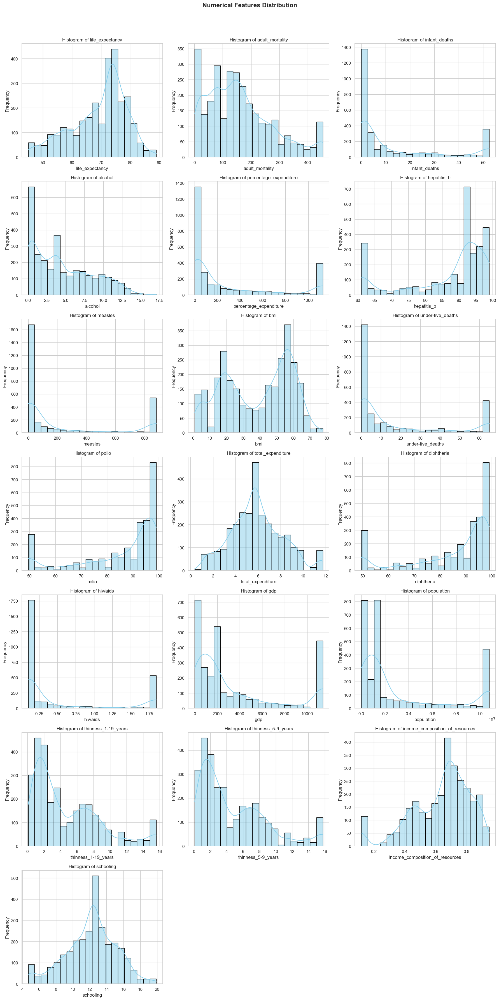

In [172]:
# Select numerical columns
num_cols = df_cleaned.select_dtypes(include='number').columns
n_cols = len(num_cols)

# Determine subplot grid size
n_rows = (n_cols // 3) + (n_cols % 3 > 0)  # 3 plots per row

# Create figure and axes
fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5 * n_rows))
axes = axes.flatten()

# Plot histograms with KDE
for i, col in enumerate(num_cols):
    sns.histplot(df_cleaned[col], bins=20, kde=True, color='skyblue', alpha=0.5, edgecolor='black', ax=axes[i])
    axes[i].set_title(f"Histogram of {col}", fontsize=12)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add main title
fig.suptitle("Numerical Features Distribution", fontsize=16, fontweight='bold', y=1.02)

plt.tight_layout()
plt.show()

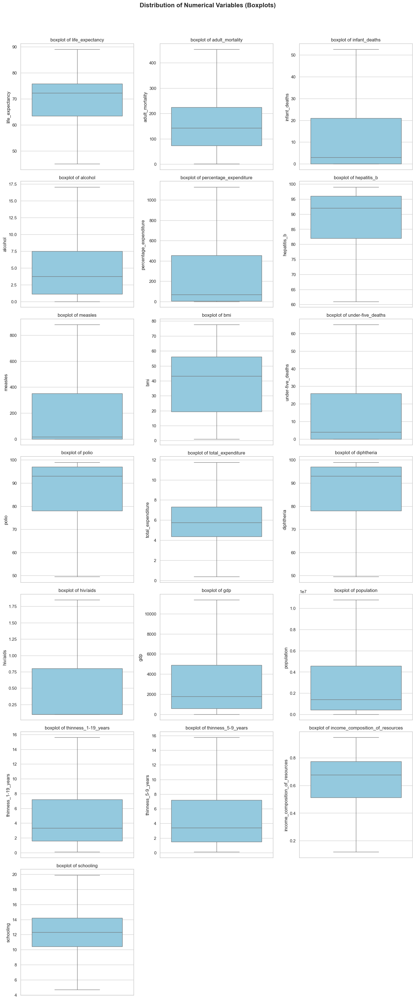

In [173]:
# Checking outliers for all numeric columns
sns.set(style="whitegrid")
def plot_box(df):
    num_cols = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

    num_plots = len(num_cols)
    num_cols_plots = 3 
    num_rows_plots = (num_plots // num_cols_plots) + (num_plots % num_cols_plots > 0)
    
    fig, axes = plt.subplots(num_rows_plots, num_cols_plots, figsize=(15, num_rows_plots * 5))
    axes = axes.flatten()  

    for i, col in enumerate(num_cols):
        sns.boxplot(df_cleaned[col], ax=axes[i], color="skyblue")
        axes[i].set_title(f'boxplot of {col}')

    for i in range(num_plots, len(axes)):
        fig.delaxes(axes[i])

    # Add main title
    fig.suptitle("Distribution of Numerical Variables (Boxplots)", fontsize=16, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

plot_box(df_cleaned)

In [174]:
# Describe object(categorical) columns
print("\nSummary Statistics for Categorical Columns: \n","-" * 45)
display(df_cleaned.describe(include= 'object').T)


Summary Statistics for Categorical Columns: 
 ---------------------------------------------


,count,unique,top,freq
country,2888,181,Afghanistan,16
year,2888,16,2015,181
status,2888,2,Developing,2376


In [175]:
# Value count for each categorical column
print("Value Count and % for each Categorical Column")
print("="*40, "\n")
for col in df_cleaned.select_dtypes(include= ['object']).columns:
    print(f"{col} ({df_cleaned[col].nunique()} unique out of {df_cleaned[col].count()} values)\n")
    count= df_cleaned[col].value_counts().sort_values(ascending=False).head(15)
    count_pct= (df_cleaned[col].value_counts(normalize=True).sort_values(ascending=False).head(15)*100).round(2)
    summary_df=pd.DataFrame({"Count": count, "Count (%)": count_pct})
    print(summary_df)
    print("-" * 50)

Value Count and % for each Categorical Column

country (181 unique out of 2888 values)

                     Count  Count (%)
country                              
Afghanistan             16       0.55
Kyrgyzstan              16       0.55
Algeria                 16       0.55
Angola                  16       0.55
Antigua and Barbuda     16       0.55
Argentina               16       0.55
Armenia                 16       0.55
Australia               16       0.55
Austria                 16       0.55
Azerbaijan              16       0.55
Bahamas                 16       0.55
Bahrain                 16       0.55
Bangladesh              16       0.55
Barbados                16       0.55
Belarus                 16       0.55
--------------------------------------------------
year (16 unique out of 2888 values)

      Count  Count (%)
year                  
2015    181       6.27
2014    181       6.27
2013    181       6.27
2012    181       6.27
2011    181       6.27
2010    181      

In [176]:
def count_plots_all(df, hue=None, rotation=0, top=None, n_cols=2, palette="Set2"):
    """
    Visualize all categorical columns in the DataFrame using count plots.

    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame.
    hue : str, optional
        Column name for grouping bars by color.
    rotation : int, optional
        Rotation angle for x-axis tick labels (default=0).
    top : int, optional
        If specified, shows only the top N categories for each column.
    n_cols : int, optional
        Number of plots per row (default=2).
    palette : str, optional
        Color palette for the plots.

    Output
    -------
    Displays multiple count plots for each categorical column.
    """

    # --- Identify categorical columns ---
    cat_cols = df.select_dtypes(include=["object", "category"]).columns.tolist()

    if not cat_cols:
        print("No categorical columns found in the DataFrame.")
        return

    # --- Setup figure size based on number of categorical columns ---
    n_rows = (len(cat_cols) + n_cols - 1) // n_cols
    plt.figure(figsize=(8 * n_cols, 5 * n_rows))

    # --- Loop through categorical columns ---
    for index, col in enumerate(cat_cols):
        plt.subplot(n_rows, n_cols, index + 1)
        order = df[col].value_counts().iloc[:top].index if top else None

        graph = sns.countplot(data=df, x=col, hue=hue, order=order, palette=palette)

        # Add count labels
        for container in graph.containers:
            graph.bar_label(container, fmt='%d', label_type='edge', fontsize=9)

        plt.title(f"Count Plot of {col.title()}", fontsize=12, fontweight="bold")
        plt.xlabel("")
        plt.ylabel("Count")
        plt.xticks(rotation=rotation)
        plt.grid(True, linestyle="--", alpha=0.3)

    plt.tight_layout()
    plt.show()

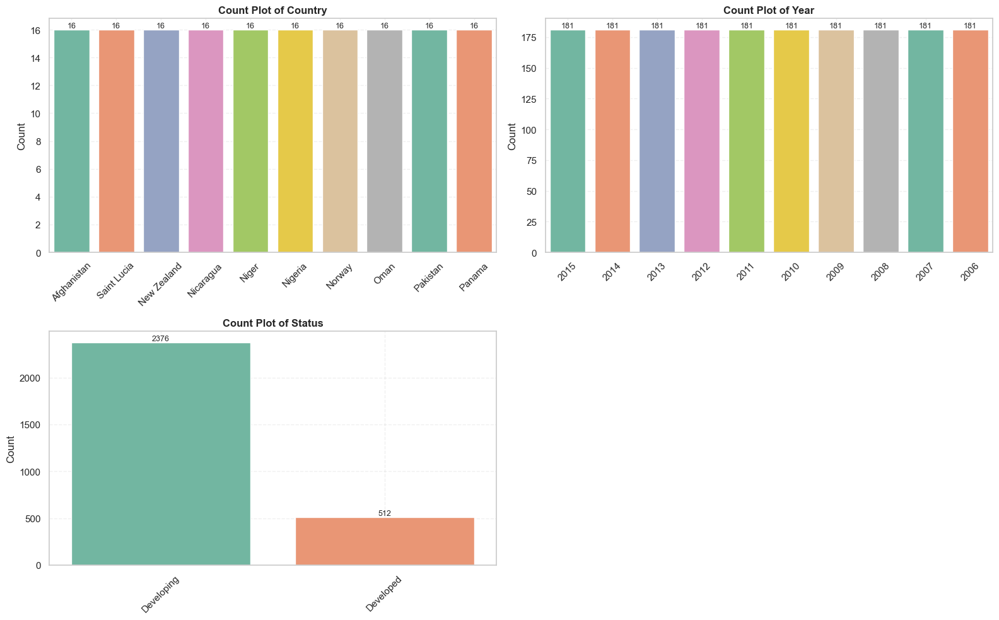

In [177]:
count_plots_all(df_cleaned, top=10, rotation=45)

#### Bivariate Analysis

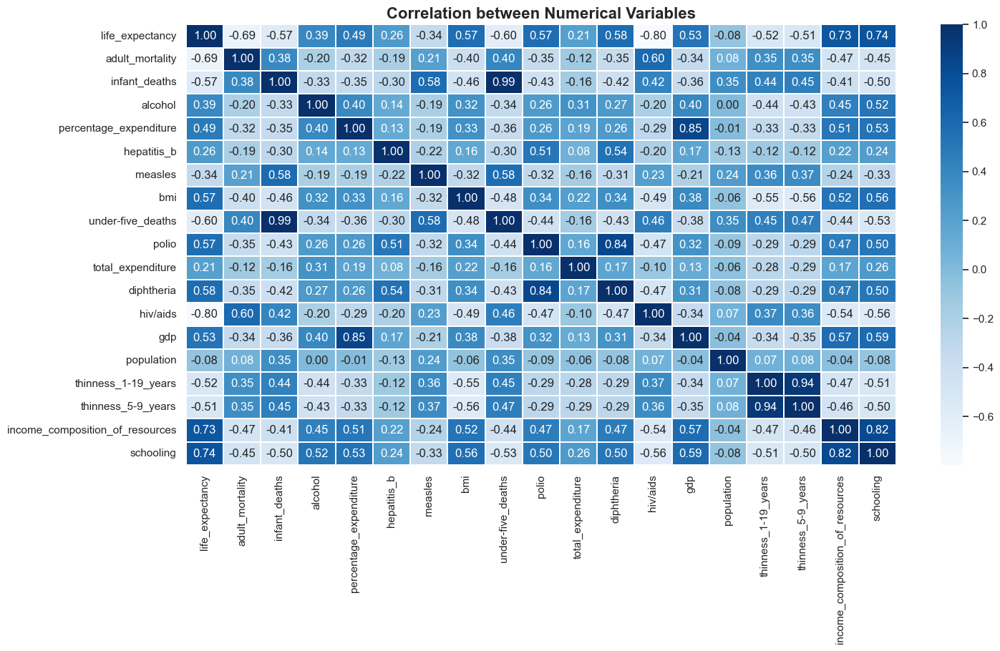

In [178]:
# first visualize correlation matrix between numerical columns

plt.figure(figsize = (16,8))
sns.heatmap(df_cleaned.select_dtypes(exclude = object).corr(), annot = True, cmap="Blues", fmt = ".2f", linewidths = 0.2)
plt.title("Correlation between Numerical Variables", fontsize=16, fontweight="bold")
plt.show()

In [179]:
def create_scatterplot(df, x_axis, column_list):
    """
    Create multiple scatter plots for numeric columns in a DataFrame.

    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame containing the data.
    x_axis : str
        Column name for the x-axis (independent variable).
    column_list : list
        List of column names (dependent variables) to plot on the y-axis.

    Output
    -------
    Displays scatter plots (2 per row) for each numeric column in 'column_list'
    to visualize relationships with the 'x_axis' variable.
    """

    # --- Validate inputs ---
    if not isinstance(column_list, list):
        raise TypeError("column_list must be a list of column names.")
    if x_axis not in df.columns:
        raise ValueError(f"'{x_axis}' not found in DataFrame columns.")
    for col in column_list:
        if col not in df.columns:
            raise ValueError(f"'{col}' not found in DataFrame columns.")
    
    # --- Plot setup ---
    n_cols = 2  # two plots per row
    n_rows = (len(column_list) + 1) // n_cols

    plt.figure(figsize=(15, 5 * n_rows))  # dynamic height based on number of plots

    for index, col in enumerate(column_list):
        plt.subplot(n_rows, n_cols, index + 1)
        sns.scatterplot(x=x_axis, y=col, data=df, color="steelblue", alpha=0.7)
        plt.title(f"{col.title().replace("_"," ")} vs {x_axis.title().replace("_"," ")}", fontsize=12, fontweight="bold")
        plt.xlabel(x_axis)
        plt.ylabel(col)
        plt.grid(True, linestyle="--", alpha=0.5)

    plt.tight_layout(pad=2)
    plt.show()

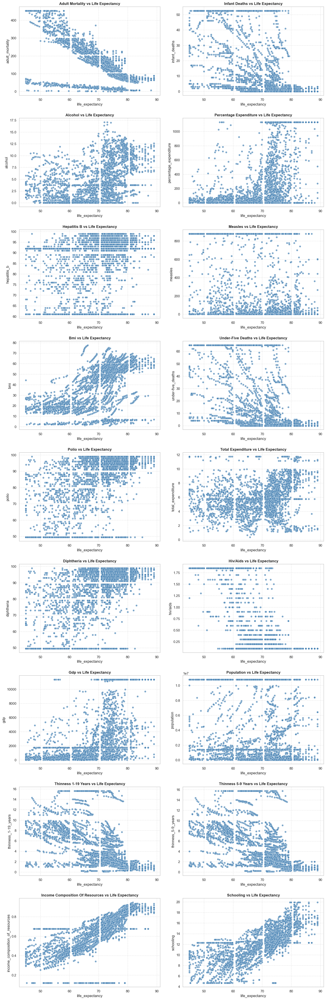

In [180]:
numerical_cols=df_cleaned.select_dtypes("number").columns.to_list()
numerical_cols.remove("life_expectancy")
create_scatterplot(df_cleaned, x_axis='life_expectancy', column_list=numerical_cols)

In [181]:
def box_plots_all(df, target_col, top=None, n_cols=2, palette="Set2"):
    """
    Visualize the distribution of a numeric target column against all categorical predictors using box plots.

    Parameters
    ----------
    df : pd.DataFrame
        The input DataFrame.
    target_col : str
        The numeric column name to plot on the y-axis.
    top : int, optional
        If provided, shows only the top N categories for each categorical predictor.
    n_cols : int, optional
        Number of plots per row (default=2).
    palette : str, optional
        Color palette for box plots.

    Output
    -------
    Displays multiple box plots comparing the numeric target with each categorical predictor.
    """

    # --- Validation ---
    if target_col not in df.columns:
        raise ValueError(f"'{target_col}' not found in DataFrame columns.")
    if not pd.api.types.is_numeric_dtype(df[target_col]):
        raise ValueError(f"'{target_col}' must be numeric.")

    # --- Identify categorical predictors ---
    cat_cols = df.select_dtypes(include=["object", "category"]).columns.tolist()
    if not cat_cols:
        print("No categorical columns found in the DataFrame.")
        return

    # --- Plot setup ---
    n_rows = (len(cat_cols) + n_cols - 1) // n_cols
    plt.figure(figsize=(8 * n_cols, 5 * n_rows))

    for index, col in enumerate(cat_cols):
        plt.subplot(n_rows, n_cols, index + 1)

        # Select top N categories (if specified)
        order = df[col].value_counts().iloc[:top].index if top else None

        # Create box plot
        sns.boxplot(data=df, x=col, y=target_col, order=order, palette=palette)
        plt.title(f"{target_col.title().replace("_", " ")} by {col.title().replace("_", " ")}", fontsize=12, fontweight="bold")
        plt.xlabel(col)
        plt.ylabel(target_col)
        plt.xticks(rotation=30)
        plt.grid(True, linestyle="--", alpha=0.4)

    plt.tight_layout()
    plt.show()

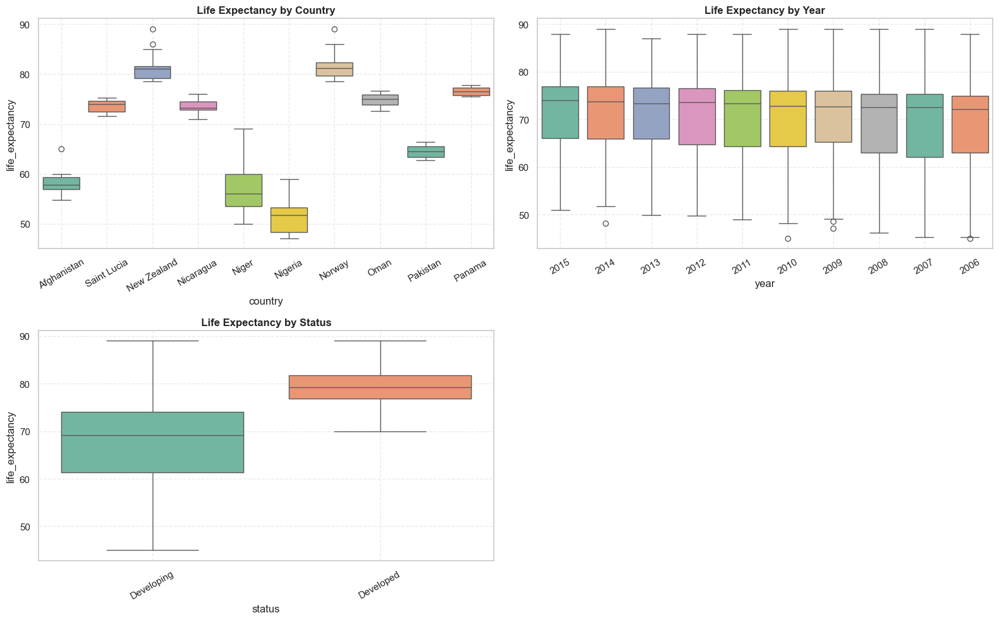

In [182]:
box_plots_all(df_cleaned, target_col='life_expectancy', top=10)

#### Multivariate Analysis

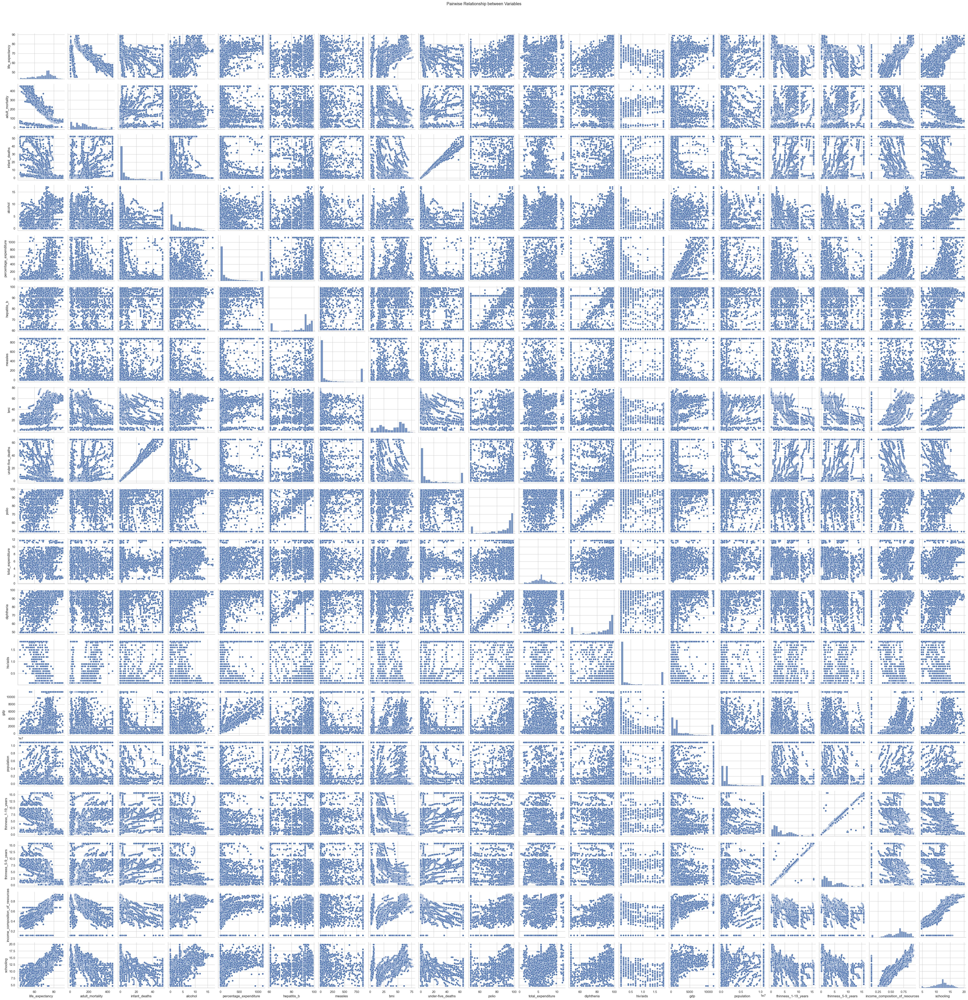

In [183]:
sns.pairplot(df_cleaned.select_dtypes(exclude= object))
plt.suptitle("Pairwise Relationship between Variables", y=1.02)
plt.show()